GROUP 13

In [2]:
from PIL import Image, ImageDraw

import numpy as np
from scipy.stats import norm
from IPython.display import display
from scipy import stats
import plotly.graph_objects as go
import pandas as pd
import scipy


In [3]:
image = Image.open('rawimage/0025.jpg').convert('L')
image.save('greyscale_0025.jpg')

In [4]:
pixel_values = list(image.getdata())
image_array = np.array(image)
df = pd.DataFrame(image_array)
df.to_excel('image_data.xlsx')


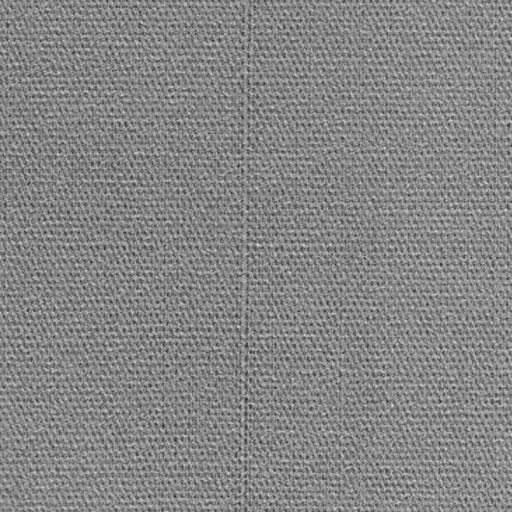

In [4]:
display(image)

In [5]:
#visualization of data as a histogram plot
fig = go.Figure(data=[go.Histogram(x=pixel_values)])

fig.show()

In [6]:
#determine the mean and standard deviation of data for normal pdf
mean = np.mean(pixel_values)
std = np.std(pixel_values)

#determine range
range_x = np.arange(0, 256)

#pdf of normal distribution which fits the data
normal_distribution = norm.pdf(range_x, mean, std)


In [7]:
fig = go.Figure(data=[go.Histogram(x=pixel_values, histnorm='probability density')])

fig.add_trace(go.Scatter(x=range_x,
                         y=normal_distribution,
                         mode='lines'
))

fig.show()

In [8]:
#determine limits
LCL = norm.ppf(0.001, mean, std)
UCL = norm.ppf(1-0.001, mean, std)

#change list data to dataframe for data manipulating
pixel_df = pd.DataFrame(pixel_values)
pixel_df = pixel_df.set_axis(['PIXELS'], axis=1)

#determine values exceed limits
pixel_df.loc[pixel_df['PIXELS'] > UCL, 'PIXELS'] = 0
pixel_df.loc[pixel_df['PIXELS'] < LCL, 'PIXELS'] = 0
modified_list = pixel_df['PIXELS'].to_list()

In [9]:
#convert data to appropriate form
new_image_array = np.array(modified_list).reshape(image.size[::-1])
new_image_array = new_image_array.astype('uint8')

#new image create with new data
new_image = Image.fromarray(new_image_array)

In [29]:
#draw rectangle around '0' values for better visualization
def draw_rectangle(image, array):
    copy_image=image.copy()
    draw = ImageDraw.Draw(copy_image)
    count = 0
    row_number = 0
    for i in array:
        column_number = 0
        for j in i:
            if j == 0:
                x = column_number
                y = row_number
                draw.rectangle([(x-2, y-2), (x+2, y+2)], outline="red")
                count += 1
            column_number += 1
        row_number += 1
    return copy_image


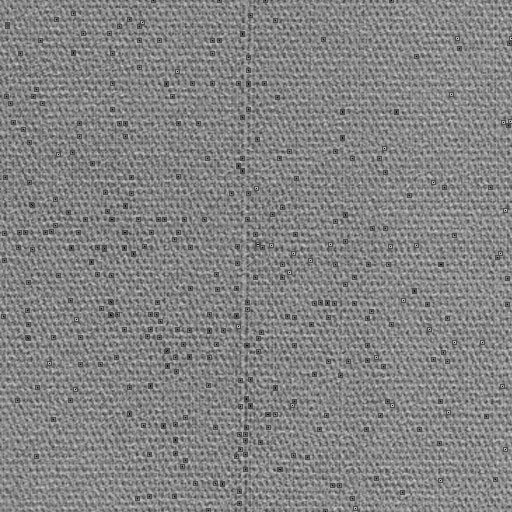

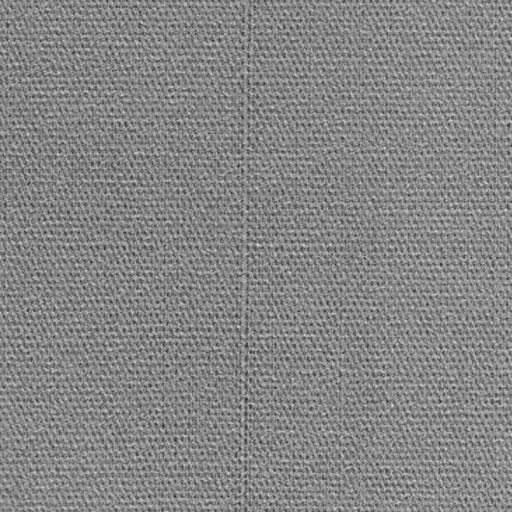

In [11]:
new_image_with_rectangles = draw_rectangle(new_image, new_image_array)
new_image_with_rectangles.save('greyscale_0025_from_first_proposal_with_detects.jpg')
display(new_image_with_rectangles)
display(image)

51x51 Window Part

In [12]:
def modify_window(window):
    # Flatten the window and identify outlier pixels
    flat_window = window.flatten()
    
    # Calculate the mean and standard deviation of the pixel values
    mean = np.mean(flat_window)
    std = np.std(flat_window)
    
    # Calculate the z-score thresholds for the desired probability limit
    LCL = norm.ppf(0.001, mean, std)
    UCL = norm.ppf(1 - 0.001, mean, std)
    outliers = np.where((flat_window < LCL) | (flat_window > UCL), True, False)
    
    # Set outlier pixels to 0
    flat_window[outliers] = 0
    # Return the modified window
    
    return flat_window.reshape(window.shape)


In [13]:
modified_img_arr = image_array.copy()

range_list = [51,102,153,204,255,306,357,408,459,510]

# Iterate over the image array using the specified window size
for i in range_list:
    for j in range_list:
        # Apply the modification to each local window
        local_window = image_array[i:i + 51, j:j + 51]
        modified_local_array = modify_window(local_window)
        modified_img_arr[i:i + 51, j:j + 51] = modified_local_array

locally_new_image = Image.fromarray(np.uint8(modified_img_arr))


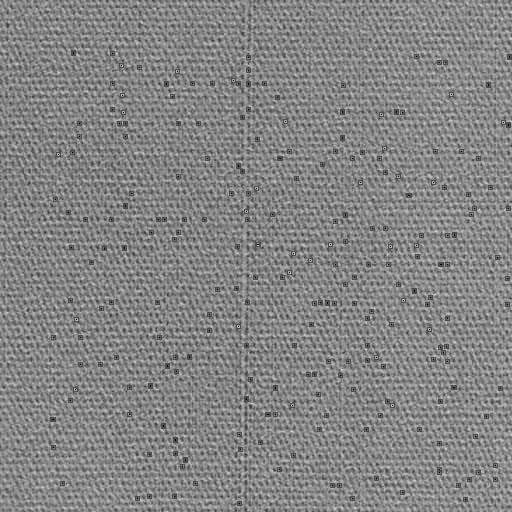

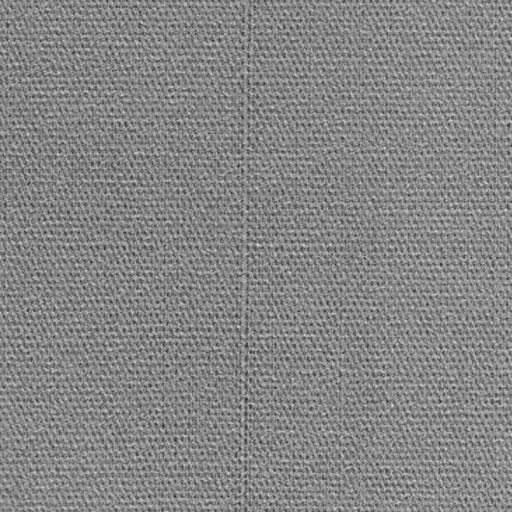

In [14]:
locally_new_image_with_rectangles = draw_rectangle(locally_new_image, np.uint8(modified_img_arr))
locally_new_image_with_rectangles.save('greyscale_0025_from_first_proposal__windows_with_detects.jpg')
display(locally_new_image_with_rectangles)
display(image)

ROW AND COLUMN PART

In [15]:
#determine row means and variances for each row
rows_mean = np.mean(image_array, axis=1)
rows_variance = np.var(image_array, axis=1)

#determine limits for each row
UCL_list = rows_mean + 3*np.sqrt(rows_variance)
LCL_list = rows_mean - 3*np.sqrt(rows_variance)

In [16]:
#determine values exceed limits for each row
row_image_array = image_array.copy()
for i in range(0,512):
    outliers = np.where((row_image_array[:i,:] < LCL) | (row_image_array[:i,:] > UCL), True, False)
    row_image_array[:i,:][outliers] = 0


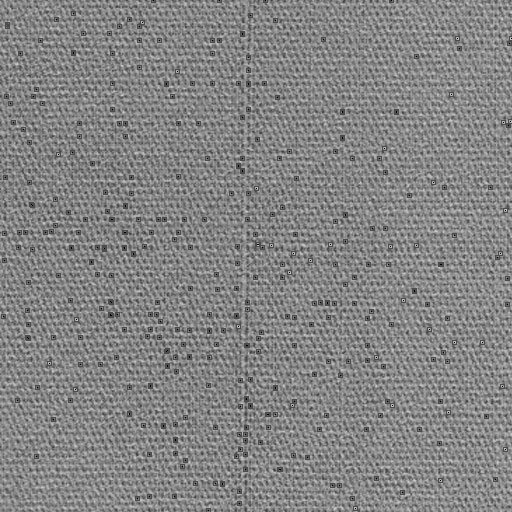

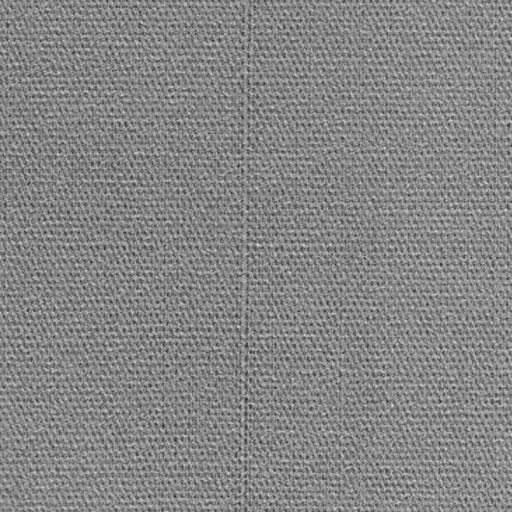

In [17]:
new_image_rows = Image.fromarray(row_image_array)

new_image_rows_with_rectangles = draw_rectangle(new_image_rows, row_image_array)
new_image_rows_with_rectangles.save('greyscale_0025_from_second_proposal_with_errors_rows.jpg')
display(new_image_rows_with_rectangles)
display(image)

In [18]:
#determine column means and variances for each column
columns_mean = np.mean(image_array, axis=1)
columns_variance = np.var(image_array, axis=1)

#determine limits for each column
UCL_list = rows_mean + 3*np.sqrt(columns_variance)
LCL_list = rows_mean - 3*np.sqrt(columns_variance)

In [19]:
column_image_array = image_array.copy()
for i in range(0,512):
    outliers = np.where((column_image_array[:i,:] < LCL) | (column_image_array[:i,:] > UCL), True, False)
    column_image_array[:i,:][outliers] = 0


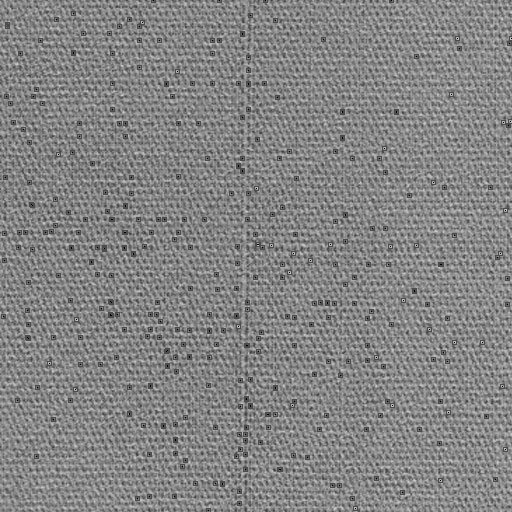

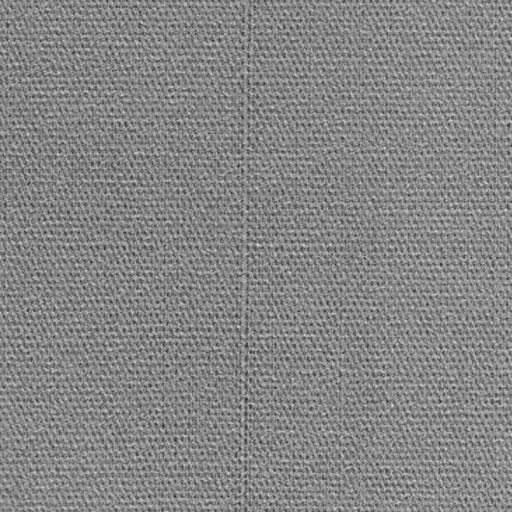

In [20]:
new_image_columns = Image.fromarray(column_image_array)

new_image_columns_with_rectangles = draw_rectangle(new_image_columns, column_image_array)
new_image_columns_with_rectangles.save('greyscale_0025_from_second_proposal_with_errors_columns.jpg')
display(new_image_columns_with_rectangles)
display(image)

OUR PROPOSAL 

In [1]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima.model import ARIMA
import statsmodels.api as sm
from pmdarima import auto_arima 
from statsmodels.tsa.statespace.sarimax import SARIMAX



In [41]:
for i in range(len(df)):
    row = df.loc[i]
    seasonal_parameter = adfuller(row)[2]
    stepwise_model = auto_arima(row, start_p=0, start_q=0,
                           max_p=2, max_q=2, m=6,
                           start_P=0, seasonal=True,
                           d=1, D=1, trace=False,
                           error_action='ignore',  
                           suppress_warnings=False, 
                           stepwise=True)
    
    order = stepwise_model.get_params()['order']
    seasonal_order = stepwise_model.get_params()['seasonal_order']
    model = SARIMAX(row, order=order, seasonal_order=seasonal_order,enforce_stationarity=False)
    model_fit = model.fit()
    predictions = model_fit.predict(start=1, end=len(row))
    predictions.index = row.index
    residuals = predictions-row

    std = np.std(residuals)
    mean = np.mean(residuals)
    
    UCL =mean+3*std
    LCL =mean-3*std
    
    residuals = np.array(residuals)
    outliers = np.logical_or(residuals < LCL, residuals > UCL)
    row[outliers] = 0
    df.loc[i] = row


c:\Users\Yusuf\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
c:\Users\Yusuf\anaconda3\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
c:\Users\Yusuf\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\Yusuf\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\Yusuf\anaconda3\lib\site-packages\statsmodels\base\model.py:607: Converge

In [42]:
our_proposal_array = df.to_numpy()
our_proposal_array

array([[109,  98, 112, ..., 102,  76, 128],
       [162, 116,  96, ...,  97, 101, 124],
       [164, 139, 117, ..., 100, 134, 154],
       ...,
       [138, 132, 115, ..., 146, 158, 144],
       [138, 129, 110, ..., 144, 159, 149],
       [143, 137, 124, ..., 159, 160, 132]], dtype=uint8)

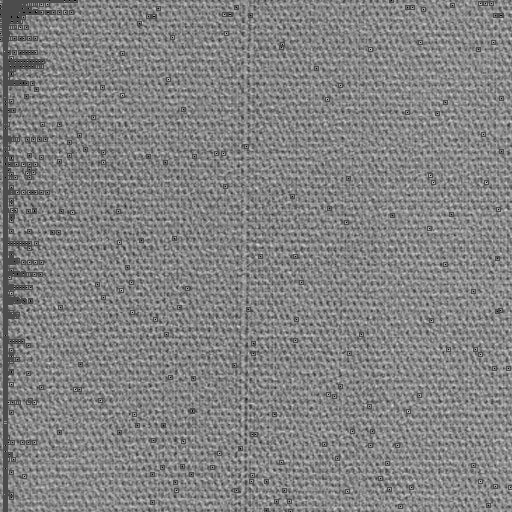

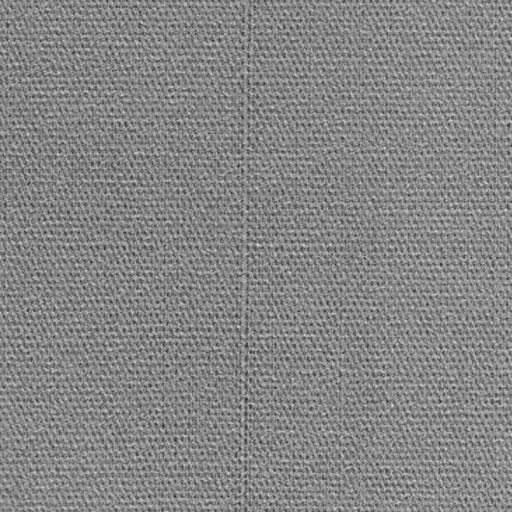

In [43]:
our_proposal_image = Image.fromarray(our_proposal_array)

our_proposal_immage_with_rectangles = draw_rectangle(our_proposal_image, our_proposal_array)
our_proposal_immage_with_rectangles.save('greyscale_0025_from_our_proposal_with_detects.jpg')
display(our_proposal_immage_with_rectangles)
display(image)